<a href="https://colab.research.google.com/github/yangjik/yang.study/blob/main/plant_pathology_2020_custom_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 사전 단계


In [ ]:
# 구글 드라이브 연동
from google.colab import drive
drive.mount('/content/gdrive/')

# 캐글
# !pip install kaggle

# 한글폰트
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Mounted at /content/gdrive/
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 6 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 7s (1,378 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading databas

In [ ]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumBarunGothic')

In [ ]:
# 캐글 접속 예시
# !mkdir /root/.kaggle/
# !cp [ kaggle.json 위치 ] /root/.kaggle/   # kaggl.json위치 지정
# !chmod 600 /root/.kaggle/kaggle.json

# !mkdir /root/.kaggle/
# !cp /content/gdrive/MyDrive/응용/kaggle/kaggle.json /root/.kaggle/   # kaggl.json위치 지정
# !chmod 600 /root/.kaggle/kaggle.json

In [ ]:
# !kaggle competitions list

In [ ]:
# !kaggle competitions download -c plant-pathology-2020-fgvc7

In [ ]:
# ls

In [ ]:
# from zipfile import ZipFile
# file_path = 'plant-pathology-2020-fgvc7.zip'

# with ZipFile(file_path, 'r') as zip:
#   zip.extractall('/content/gdrive/MyDrive/응용/kaggle/plant/data')
#   print('완료')

### 패키지 불러오기

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
import random
import os, shutil
from sklearn.model_selection import train_test_split

# Kaggle) Plant Pathology 2020 건강한 잎 / 병든 잎 이미지 분류하기
- 대회 사이트
  - https://www.kaggle.com/competitions/plant-pathology-2020-fgvc7/overview
- 참고 자료
  - https://www.kaggle.com/code/nightwolfbrooks/data-augmentation-and-keras-cnn

### 데이터 구성 및 컬럼 의미 파악
- image_id: the foreign key / 외래 키
- multiple_diseases: one of the target labels / 여러 질병
- healthy: one of the target labels / 건강
- rust: one of the target labels / 녹병
- scab: one of the target labels / 붉은 곰팡이병

In [ ]:
file_path = '/content/gdrive/MyDrive/응용/kaggle/plant/data/'
train_df = pd.read_csv(file_path + 'train.csv')
test_df = pd.read_csv(file_path + 'test.csv')
train_df.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [ ]:
train_df.shape

(1821, 5)

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1821 entries, 0 to 1820
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   image_id           1821 non-null   object
 1   healthy            1821 non-null   int64 
 2   multiple_diseases  1821 non-null   int64 
 3   rust               1821 non-null   int64 
 4   scab               1821 non-null   int64 
dtypes: int64(4), object(1)
memory usage: 71.3+ KB


In [ ]:
train_df['img_file'] = train_df['image_id'] + '.jpg'

In [ ]:
# train_df = train_df.replace({'healthy' : 1}, '건강')
train_df = train_df.replace({'multiple_diseases' : 1}, 2)
train_df = train_df.replace({'rust' : 1}, 3)
train_df = train_df.replace({'scab' : 1}, 4)

In [ ]:
train_df.head()

,image_id,healthy,multiple_diseases,rust,scab,img_file
0,Train_0,0,0,0,4,Train_0.jpg
1,Train_1,0,2,0,0,Train_1.jpg
2,Train_2,1,0,0,0,Train_2.jpg
3,Train_3,0,0,3,0,Train_3.jpg
4,Train_4,1,0,0,0,Train_4.jpg


In [ ]:
# label 숫자형
train_df['label']  = train_df['healthy'] + train_df['multiple_diseases'] + train_df['rust'] + train_df['scab']

In [ ]:
# label 문자형으로 변환
label_str = []
for _ in (train_df['label']):
  if _ == 1:
    _ = str(_)
    _ = _.replace('1', 'healthy')
    label_str.append(_)
  elif _ == 2:
    _ = str(_)
    _ = _.replace('2', 'multiple_diseases')
    label_str.append(_)
  elif _ == 3:
    _ = str(_)
    _ = _.replace('3', 'rust')
    label_str.append(_)
  elif _ == 4:
    _ = str(_)
    _ = _.replace('4', 'scab')
    label_str.append(_)
label_str[:5]

['scab', 'multiple_diseases', 'healthy', 'rust', 'healthy']

In [ ]:
# label 문자형
train_df['label_str'] = label_str

In [ ]:
train_df.head()

,image_id,healthy,multiple_diseases,rust,scab,img_file,label,label_str
0,Train_0,0,0,0,4,Train_0.jpg,4,scab
1,Train_1,0,2,0,0,Train_1.jpg,2,multiple_diseases
2,Train_2,1,0,0,0,Train_2.jpg,1,healthy
3,Train_3,0,0,3,0,Train_3.jpg,3,rust
4,Train_4,1,0,0,0,Train_4.jpg,1,healthy


In [ ]:
test_df.head

<bound method NDFrame.head of        image_id
0        Test_0
1        Test_1
2        Test_2
3        Test_3
4        Test_4
...         ...
1816  Test_1816
1817  Test_1817
1818  Test_1818
1819  Test_1819
1820  Test_1820

[1821 rows x 1 columns]>

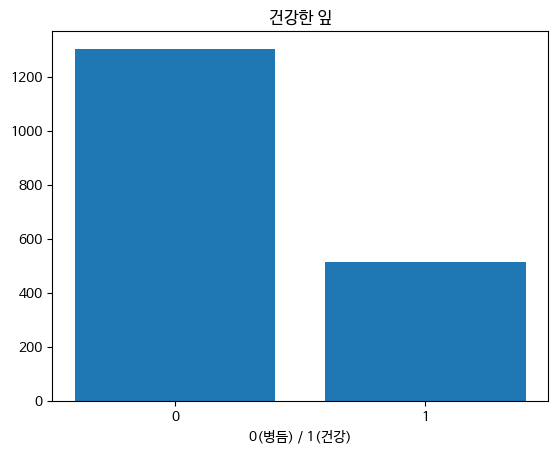

In [ ]:
# 건강한 잎 개수 확인
plt.bar(data=train_df, x=train_df['healthy'].value_counts().index, height=train_df['healthy'].value_counts())

plt.title('건강한 잎')
plt.xticks(train_df['healthy'].value_counts().index)
plt.xlabel('0(병듬) / 1(건강)')
plt.show()

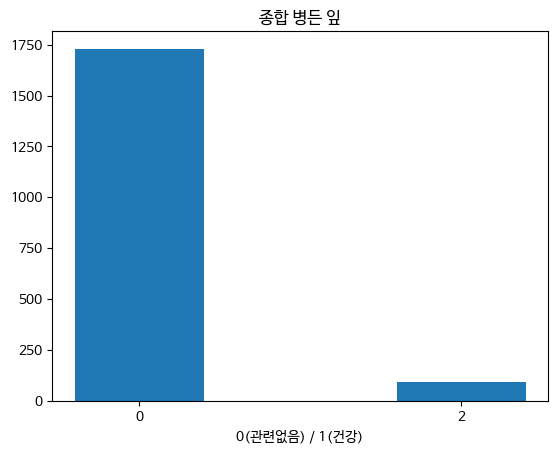

In [ ]:
# 종합 병든 잎 개수 확인
plt.bar(data=train_df, x=train_df['multiple_diseases'].value_counts().index, height=train_df['multiple_diseases'].value_counts())

plt.title('종합 병든 잎')
plt.xticks(train_df['multiple_diseases'].value_counts().index)
plt.xlabel('0(관련없음) / 1(건강)')
plt.show()

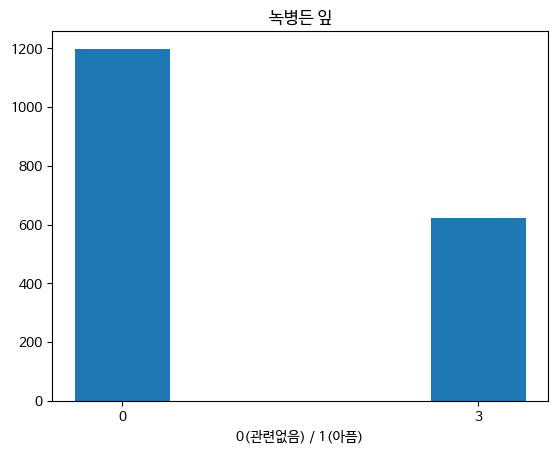

In [ ]:
# 녹병든 잎 개수 확인
plt.bar(data=train_df, x=train_df['rust'].value_counts().index, height=train_df['rust'].value_counts())

plt.title('녹병든 잎')
plt.xticks(train_df['rust'].value_counts().index)
plt.xlabel('0(관련없음) / 1(아픔)')
plt.show()

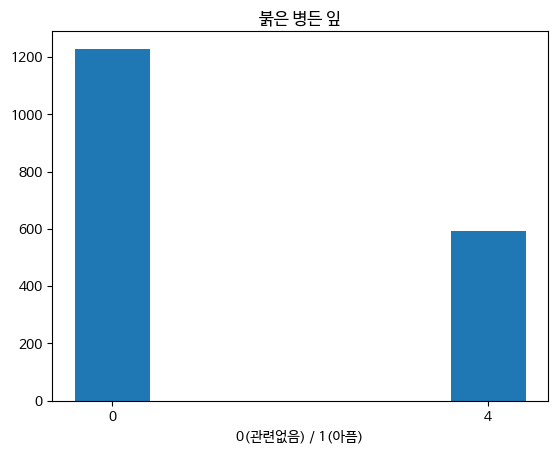

In [ ]:
# 붉은 병든 잎 개수 확인
plt.bar(data=train_df, x=train_df['scab'].value_counts().index, height=train_df['scab'].value_counts())

plt.title('붉은 병든 잎')
plt.xticks(train_df['scab'].value_counts().index)
plt.xlabel('0(관련없음) / 1(아픔)')
plt.show()

위 결과를 확인하면 각 bar 형태에서 해당 병 or 건강한 잎들은 1의 값에 해당한 것을 확인했다. <br>그래서 원형 차트를 통해서 구체적으로 확인 해보자

In [ ]:
# 각 각의 1인 값 확인
healthy = train_df[train_df['healthy'] == 1].shape[0]
multiple_diseases = train_df[train_df['multiple_diseases'] == 2].shape[0]
rust = train_df[train_df['rust'] == 3].shape[0]
scab = train_df[train_df['scab'] == 4].shape[0]

pie_val = [healthy, multiple_diseases, rust, scab]
pie_label = ['healthy', 'multiple_diseases', 'rust', 'scab']

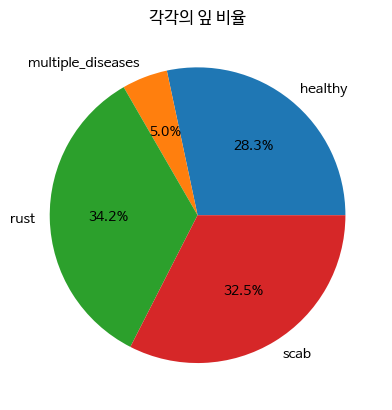

In [ ]:
# 원형 차트로 비율 확인
plt.pie(pie_val, labels=pie_label, autopct='%.1f%%')

plt.title('각각의 잎 비율')
plt.show()

#### 비율 해결 방안1.
- 모든 질병을 가진 잎을 ImageDataGenerator 작업을 진행하고 전체 비율 확인 -><br>
그 후 train, validation 데이터 분리 후 기존 방법 적용

In [ ]:
# 데이터 개수 확인
train_df[train_df['label'] == 2].shape

(91, 8)

#### 이미지의 개수를 opencv작업을 통해서 데이터를 증가 시킨다.
- https://colab.research.google.com/drive/1jNh6JqQyGFszUrLsd0E_nzE8liBhkWGD

In [ ]:
new_df_path = '/content/gdrive/MyDrive/응용/kaggle/plant/data/new_train.csv'

new_df = pd.read_csv(new_df_path, index_col=False)
new_df.head()

,image_id,healthy,multiple_diseases,rust,scab,img_file,label,label_str
0,Train_0,0,0,0,4,Train_0.jpg,4,scab
1,Train_1,0,2,0,0,Train_1.jpg,2,multiple_diseases
2,Train_2,1,0,0,0,Train_2.jpg,1,healthy
3,Train_3,0,0,3,0,Train_3.jpg,3,rust
4,Train_4,1,0,0,0,Train_4.jpg,1,healthy


In [ ]:
new_df.shape

(2185, 8)

### 데이터 추가한 데이터 프레임 비율 시각화

In [ ]:
healthy = new_df[new_df['healthy'] == 1].shape[0]
multiple_diseases = new_df[new_df['multiple_diseases'] == 2].shape[0]
rust = new_df[new_df['rust'] == 3].shape[0]
scab = new_df[new_df['scab'] == 4].shape[0]

pie_val = [healthy, multiple_diseases, rust, scab]
pie_label = ['healthy', 'multiple_diseases', 'rust', 'scab']

In [ ]:
new_df['label_str'].value_counts()

rust                 622
scab                 592
healthy              516
multiple_diseases    455
Name: label_str, dtype: int64

In [ ]:
multiple_diseases = new_df[new_df['multiple_diseases'] == 2].shape[0]
multiple_diseases

455

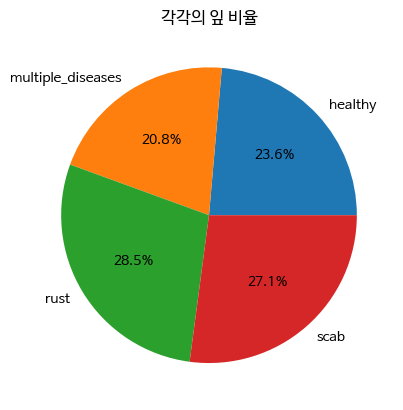

In [ ]:
# 원형 차트로 비율 확인
plt.pie(pie_val, labels=pie_label, autopct='%.1f%%')

plt.title('각각의 잎 비율')
plt.show()

위 비율을 확인하면 데이터양이 많이 증가 되었다.

#### 비율 해결 방안2.
- multiple_diseases 이미지 삭제, 메인 데이터 프레임인  train_df 에서 해당 파일 삭제


In [ ]:
# drop_df = train_df[train_df['label'] == 2]

In [ ]:
# drop_file_path = '/content/gdrive/MyDrive/응용/kaggle/plant/data/train/'

# drop_file_name = drop_df.loc[:, 'img_file'].to_list()

파일 삭제

In [ ]:
# for _ in drop_file_name:
#   file = drop_file_path + _
#   if os.path.isfile(file):
#     os.remove(file)
#     print(file, '삭제 완')

메인 train_df에서 삭제 후 각 컬럼 정리

In [ ]:
# train_df.drop(drop_df.index, inplace=True)

In [ ]:
# rename_str = train_df.loc[:, 'label_str'].to_list()

In [ ]:
# # label 재정의
# train_df.loc[train_df['label'] == 3, 'label'] = 2
# train_df.loc[train_df['label'] == 4, 'label'] = 3

In [ ]:
# train_df.head()

In [ ]:
# train_df.reset_index(drop=False, inplace=False)

In [ ]:
# pie_val = [healthy, rust, scab]
# pie_label = ['healthy', 'rust', 'scab']

# # 원형 차트로 비율 확인
# plt.pie(pie_val, labels=pie_label, autopct='%.1f%%')

# plt.title('각각의 잎 비율')
# plt.show()

그리고 학습시킬때 클래스 4 -> 3으로 줄이기


## 데이터 정제전 모델 학습

### 이미지 시각화

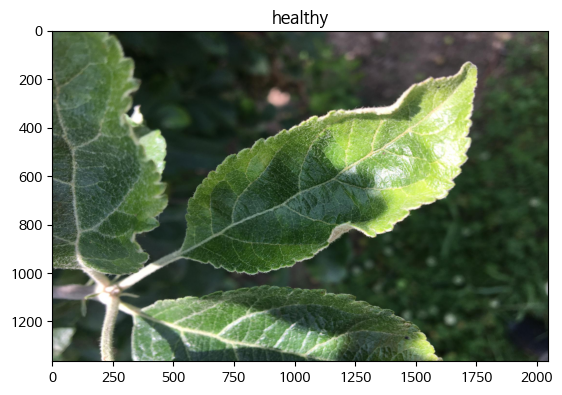

In [ ]:
# 랜덤 이미지 확인
import random

# Train 이미지에서 랜덤으로 얻기
img_path = '/content/gdrive/MyDrive/응용/kaggle/plant/data/images/'
random_img = 'Train_' + str(random.randint(0, 1822))
total_path = img_path + random_img + '.jpg'

# 파일의 이름 얻기
want_name = train_df[train_df['image_id'] == random_img]

if want_name['label'].iloc[0] == 1:
  name = 'healthy'
elif want_name['label'].iloc[0] == 2:
  name = 'multiple_diseases'
elif want_name['label'].iloc[0] == 3:
  name = 'rust'
elif want_name['label'].iloc[0] == 4:
  name = 'scab'

# 이미지 출력
img = plt.imread(total_path)
plt.imshow(img)
plt.title(name)
plt.show()

### 이미지 폴더 나누기
이미지 폴더를 확인하면 Train 데이터랑 Test 데이터가 같이 있다.<br>
즉 train 폴더랑 test 폴더를 나눠야 한다.

In [ ]:
# import os, shutil

# # 이미지 있는 메인 폴더
# main_base_dir = '/content/gdrive/MyDrive/응용/kaggle/plant/data/images'

# # 새롭게 만들 train, test 폴더
# new_dir = '/content/gdrive/MyDrive/응용/kaggle/plant/data/'

# # 폴더 생성 - 재실행시 에러 없애기 위해 폴더 존재하면 폴더 + 이미지 삭제 후 폴더 생성
# train_dir = os.path.join(new_dir, 'train')
# if os.path.exists(new_dir+'train'):
#     shutil.rmtree(new_dir+'train')
# os.mkdir(train_dir)

# test_dir = os.path.join(new_dir, 'test')
# if os.path.exists(new_dir+'test'):
#     shutil.rmtree(new_dir+'test')
# os.mkdir(test_dir)

# # 이미지 있는 메인폴더 train, test 폴더로 이미지 복사
# fnames = ['Train_{}.jpg'.format(i) for i in range(0, 1821)]
# for fname in fnames:
#     src = os.path.join(main_base_dir, fname)
#     dst = os.path.join(train_dir, fname)
#     shutil.copyfile(src, dst)

# fnames = ['Test_{}.jpg'.format(i) for i in range(0, 1821)]
# for fname in fnames:
#     src = os.path.join(main_base_dir, fname)
#     dst = os.path.join(test_dir, fname)
#     shutil.copyfile(src, dst)

# # 복사하고 최종 해당 폴더 파일개수 확인
# path = new_dir + 'train'
# file_list = os.listdir(path)
# train_folder = len(file_list)

# path = new_dir + 'test'
# file_list = os.listdir(path)
# test_folder = len(file_list)
# print('train 폴더 : ', train_folder, '\ntest 폴더 : ', test_folder)

### Train img 양 늘리기.
- keras : ImageDataGenerator 사용하기

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split


In [ ]:
train_df['label_str']

0                    scab
1       multiple_diseases
2                 healthy
3                    rust
4                 healthy
              ...        
1816                 scab
1817              healthy
1818              healthy
1819                 rust
1820                 scab
Name: label_str, Length: 1821, dtype: object

In [ ]:
new_train_df = pd.concat([train_df['img_file'], train_df['label_str']], axis=1, ignore_index=True)
new_train_df.columns = ['img_file', 'label_str']
new_train_df.head()

,img_file,label_str
0,Train_0.jpg,scab
1,Train_1.jpg,multiple_diseases
2,Train_2.jpg,healthy
3,Train_3.jpg,rust
4,Train_4.jpg,healthy


In [ ]:
# 데이터 나누기
train_img, valide_img = train_test_split(new_train_df, random_state=42, train_size=0.8)

In [ ]:
# 이미지 설정
img_w = 150
img_h = 150
img_c = 3
img_s = (img_w, img_h)
batch_size = 10

In [ ]:
train_img.head()

,img_file,label_str
1455,Train_1455.jpg,rust
1552,Train_1552.jpg,healthy
300,Train_300.jpg,healthy
1708,Train_1708.jpg,multiple_diseases
611,Train_611.jpg,rust


In [ ]:
# 이미지 증식
train_img_generator = ImageDataGenerator(
  rotation_range=15,            # 회전
  rescale=1./255,               # resize
  shear_range=0.1,              # 뚜렷하게보이기?
  zoom_range=0.2,               # 확대
  horizontal_flip=True,         # 뒤집기
  width_shift_range=0.1,        # 옆으로 이동
  height_shift_range=0.1        # 위로 이동
)

train_result = train_img_generator.flow_from_dataframe(
    dataframe=train_img,
    directory=file_path+'train/',
    x_col='img_file',
    y_col='label_str',
    target_size=(img_w, img_h),
    class_mode='categorical',
    batch_size=batch_size
)

Found 1456 validated image filenames belonging to 4 classes.


In [ ]:
valide_img_generator = ImageDataGenerator(rescale=1./255)
valide_result = valide_img_generator.flow_from_dataframe(
    dataframe=valide_img,
    directory=file_path+'train/',
    x_col='img_file',
    y_col='label_str',
    target_size=(img_w, img_h),
    class_mode='categorical',
    batch_size=batch_size
)

Found 365 validated image filenames belonging to 4 classes.


In [ ]:
ex_df = train_img.sample(n=1).reset_index(drop=True)
ex_result = train_img_generator.flow_from_dataframe(
    dataframe=ex_df,
    directory=file_path+'train/',
    x_col='img_file',
    y_col='label_str',
    target_size=(img_w, img_h),
    class_mode='categorical'
)

Found 1 validated image filenames belonging to 1 classes.


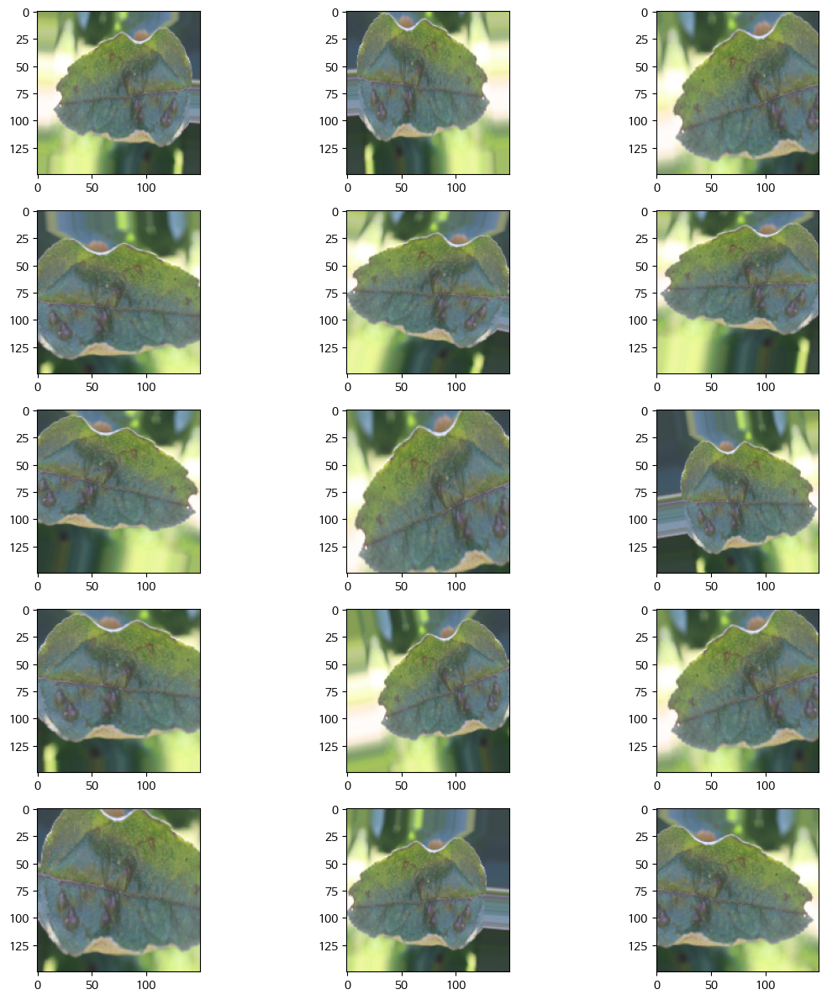

In [ ]:
# 위에서 만든 증식된이미지 확인하기
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in ex_result:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

### 모델의 상황 - Callback

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
#              관찰하는 수량이 개선x 학습 정지    측정 항목이 향상되지 않을 경우 학습속도 줄인다.
earlystop = EarlyStopping(patience=10)      # 최소 epoch 설정
learn_reduce = ReduceLROnPlateau(
    monitor='loss', patience=2, verbose=1, factor=0.5, min_lr=0.00001
#     관찰대상  / 학습 부진세대 / 최신화메신지 / 학습 속도 줄이는 수치 / 학습속도 하한선
)

In [ ]:
# callback 지정
callbacks = [earlystop, learn_reduce]

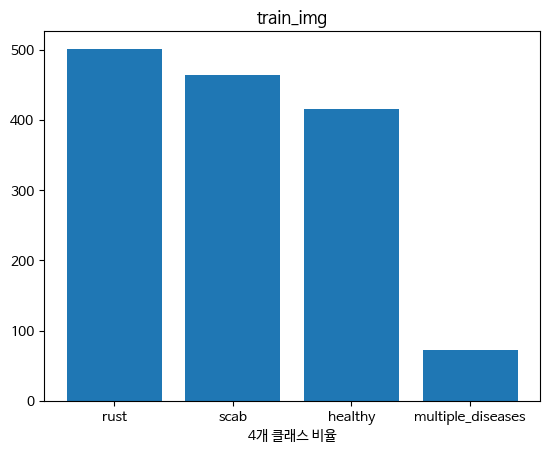

In [ ]:
# 데이터 분리 후 train_img 분류 확인
plt.bar(train_img['label_str'].value_counts().index, train_img['label_str'].value_counts())

plt.title('train_img')
plt.xlabel('4개 클래스 비율')
plt.xticks(train_img['label_str'].value_counts().index)
plt.show()

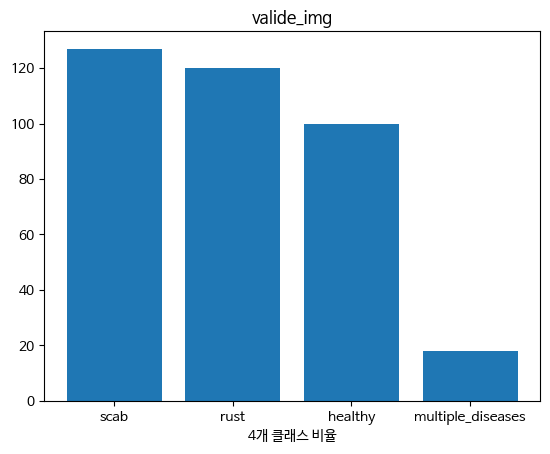

In [ ]:
# 데이터 분리 후 train_img 분류 확인
plt.bar(valide_img['label_str'].value_counts().index, valide_img['label_str'].value_counts())

plt.title('valide_img')
plt.xlabel('4개 클래스 비율')
plt.xticks(valide_img['label_str'].value_counts().index)
plt.show()

### 모델 구축


---





In [ ]:
from keras.src.backend import dropout
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

In [ ]:
sq = Sequential()

sq.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_w, img_h, img_c) ))
sq.add(BatchNormalization())
sq.add(MaxPooling2D(pool_size=(2, 2)))
sq.add(Dropout(0.25))

sq.add(Conv2D(64, (3, 3), activation='relu' ))
sq.add(BatchNormalization())
sq.add(MaxPooling2D(pool_size=(2, 2)))
sq.add(Dropout(0.25))

sq.add(Conv2D(128, (3, 3), activation='relu' ))
sq.add(BatchNormalization())
sq.add(MaxPooling2D(pool_size=(2, 2)))
sq.add(Dropout(0.25))


sq.add(Flatten())
sq.add(Dense(512, activation='relu'))
sq.add(BatchNormalization())
sq.add(Dropout(0.5))
sq.add(Dense(4, activation='softmax'))


sq.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
sq.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 batch_normalization_4 (Bat  (None, 148, 148, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 dropout_4 (Dropout)         (None, 74, 74, 32)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 batch_normalization_5 (Bat  (None, 72, 72, 64)       

In [ ]:
df = train_df[['img_file', 'label']]
df.head()

,img_file,label
0,Train_0.jpg,4
1,Train_1.jpg,2
2,Train_2.jpg,1
3,Train_3.jpg,3
4,Train_4.jpg,1


### 모델 학습

In [ ]:
train_total = train_img.shape[0]
valide_total = valide_img.shape[0]

In [ ]:
epochs=10
history = sq.fit_generator(
    train_result,
    epochs = epochs,
    validation_data=valide_result,
    validation_steps=int(train_total/batch_size),
    steps_per_epoch=int(valide_total/batch_size),
    callbacks=callbacks
)

# history = sq.fit(
#     train_result,
#     epochs = epochs,
#     validation_data=valide_result,
#     validation_steps=int(train_total/batch_size),
#     steps_per_epoch=int(valide_total/batch_size),
#     callbacks=callbacks
# )

<ipython-input-93-644a90078696>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = sq.fit_generator(


Epoch 1/10
36/36 [==============================] - ETA: 0s - loss: 2.3753 - accuracy: 0.3528

36/36 [==============================] - 270s 7s/step - loss: 2.3753 - accuracy: 0.3528 - val_loss: 5.1198 - val_accuracy: 0.3151 - lr: 0.0010
Epoch 2/10
36/36 [==============================] - ETA: 0s - loss: 2.0580 - accuracy: 0.3371

36/36 [==============================] - 87s 2s/step - loss: 2.0580 - accuracy: 0.3371 - lr: 0.0010
Epoch 3/10
36/36 [==============================] - ETA: 0s - loss: 1.8366 - accuracy: 0.3861

36/36 [==============================] - 61s 2s/step - loss: 1.8366 - accuracy: 0.3861 - lr: 0.0010
Epoch 4/10
36/36 [==============================] - ETA: 0s - loss: 1.7328 - accuracy: 0.3861

36/36 [==============================] - 62s 2s/step - loss: 1.7328 - accuracy: 0.3861 - lr: 0.0010
Epoch 5/10
36/36 [==============================] - ETA: 0s - loss: 1.6604 - accuracy: 0.4000

36/36 [==============================] - 45s 1s/step - loss: 1.6604 - accuracy: 0.4000 - lr: 0.0010
Epoch 6/10
36/36 [==============================] - ETA: 0s - loss: 1.5532 - accuracy: 0.4222

36/36 [==============================] - 34s 941ms/step - loss: 1.5532 - accuracy: 0.4222 - lr: 0.0010
Epoch 7/10
36/36 [==============================] - ETA: 0s - loss: 1.4846 - accuracy: 0.3972

36/36 [==============================] - 26s 727ms/step - loss: 1.4846 - accuracy: 0.3972 - lr: 0.0010
Epoch 8/10
36/36 [==============================] - ETA: 0s - loss: 1.4752 - accuracy: 0.4073

36/36 [==============================] - 18s 510ms/step - loss: 1.4752 - accuracy: 0.4073 - lr: 0.0010
Epoch 9/10
36/36 [==============================] - ETA: 0s - loss: 1.5519 - accuracy: 0.3764

36/36 [==============================] - 16s 432ms/step - loss: 1.5519 - accuracy: 0.3764 - lr: 0.0010
Epoch 10/10
36/36 [==============================] - ETA: 0s - loss: 1.6310 - accuracy: 0.3764


Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
36/36 [==============================] - 16s 444ms/step - loss: 1.6310 - accuracy: 0.3764 - lr: 0.0010


In [ ]:
history.history

{'loss': [2.3752832412719727,
  2.0580127239227295,
  1.8366345167160034,
  1.7327673435211182,
  1.6604461669921875,
  1.5531928539276123,
  1.4845678806304932,
  1.4752389192581177,
  1.5519174337387085,
  1.6310397386550903],
 'accuracy': [0.35277777910232544,
  0.33707866072654724,
  0.3861111104488373,
  0.3861111104488373,
  0.4000000059604645,
  0.42222222685813904,
  0.39722222089767456,
  0.4073033630847931,
  0.3764044940471649,
  0.3764044940471649],
 'val_loss': [5.119790554046631],
 'val_accuracy': [0.31506848335266113],
 'lr': [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 0.001]}

In [ ]:
history.history['loss']

[2.3752832412719727,
 2.0580127239227295,
 1.8366345167160034,
 1.7327673435211182,
 1.6604461669921875,
 1.5531928539276123,
 1.4845678806304932,
 1.4752389192581177,
 1.5519174337387085,
 1.6310397386550903]

In [ ]:
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
# ax1.plot(history.history['loss'], color='b', label="Training loss")
# ax1.plot(history.history['val_loss'], color='r', label="validation loss")
# ax1.set_xticks(np.arange(1, epochs, 1))
# ax1.set_yticks(np.arange(0, 1, 0.1))

# ax2.plot(history.history['accuracy'], color='b', label="Training accuracy")
# ax2.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
# ax2.set_xticks(np.arange(1, epochs, 1))

# legend = plt.legend(loc='best', shadow=True)
# plt.tight_layout()
# plt.show()

### test 데이터 가져오기

In [ ]:
import os
testimg_path = '/content/gdrive/MyDrive/응용/kaggle/plant/data/test/'
test_filenames = os.listdir(testimg_path)
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]

In [ ]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    dataframe=test_df,
    directory=testimg_path,
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=(img_w, img_h),
    batch_size=batch_size,
    shuffle=False
)

Found 1821 validated image filenames.


### 예측

In [ ]:
predict = sq.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))

<ipython-input-99-bc98740d40ca>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predict = sq.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))


In [ ]:
test_df['label'] = np.argmax(predict, axis=-1)

In [ ]:
test_df['label'].unique()

array([2, 0, 1, 3])

In [ ]:
test_df['label'] = test_df['label'].replace({
    'healthy': 0,
    'multiple_diseases': 1,
    'rust' : 2,
    'scab' : 3
})

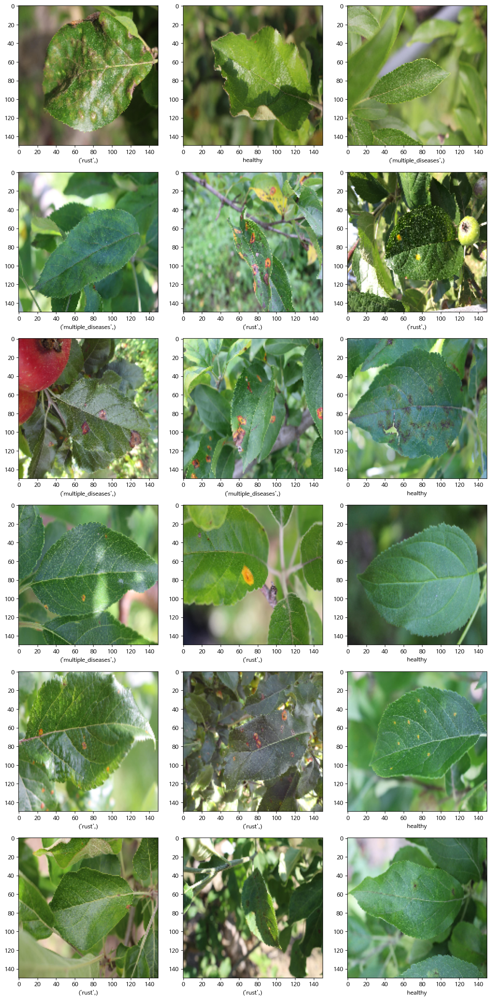

In [ ]:
from keras.preprocessing.image import load_img
sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test.iterrows():
    filename = row['filename']
    label = row['label']
    img = load_img(testimg_path+filename, target_size=(img_w, img_h))
    if label == 0:
      label='healthy'
    elif label == 1:
      label = 'multiple_diseases',
    elif label == 2:
      label = 'rust',
    elif label == 3:
      label = 'scab'
    else :
      label = '인식실패'

    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    # plt.xlabel(filename + '(' + "{}".format(label) + ')' )
    plt.xlabel(label)
plt.tight_layout()
plt.show()

## 정제 후 모델 학습

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

In [ ]:
new_df['label_str'].value_counts()

rust                 622
scab                 592
healthy              516
multiple_diseases    455
Name: label_str, dtype: int64

In [ ]:
train_df = new_df[['img_file', 'label_str']]

In [ ]:
train_df['label_str'].value_counts()

rust                 622
scab                 592
healthy              516
multiple_diseases    455
Name: label_str, dtype: int64

In [ ]:
# 데이터 나누기
train_img, valide_img = train_test_split(train_df, random_state=42, train_size=0.8)

In [ ]:
# 이미지 설정
img_w = 300
img_h = 300
img_c = 3
img_s = (img_w, img_h)
batch_size = 10

### 모델의 상황 - Callback

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
#              관찰하는 수량이 개선x 학습 정지    측정 항목이 향상되지 않을 경우 학습속도 줄인다.
earlystop = EarlyStopping(patience=10)      # 최소 epoch 설정
learn_reduce = ReduceLROnPlateau(
    monitor='loss', patience=2, verbose=1, factor=0.5, min_lr=0.00001
#     관찰대상  / 학습 부진세대 / 최신화메신지 / 학습 속도 줄이는 수치 / 학습속도 하한선
)

In [ ]:
# callback 지정
callbacks = [earlystop, learn_reduce]

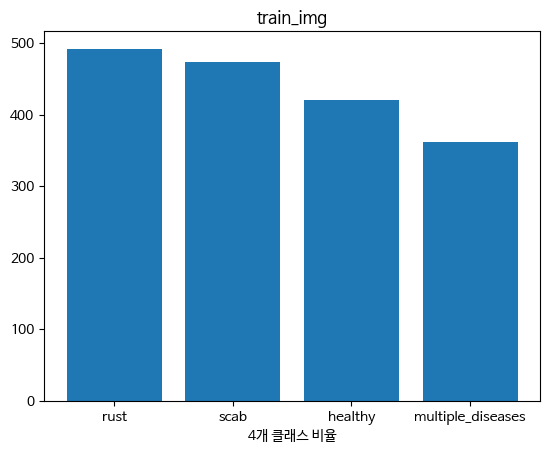

In [ ]:
# 데이터 분리 후 train_img 분류 확인
plt.bar(train_img['label_str'].value_counts().index, train_img['label_str'].value_counts())

plt.title('train_img')
plt.xlabel('4개 클래스 비율')
plt.xticks(train_img['label_str'].value_counts().index)
plt.show()

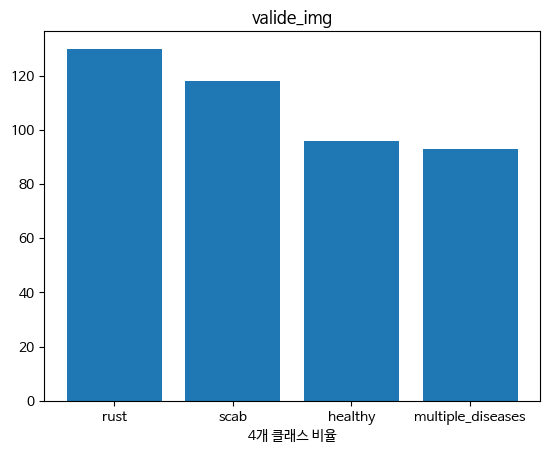

In [ ]:
# 데이터 분리 후 valide_img 분류 확인
plt.bar(valide_img['label_str'].value_counts().index, valide_img['label_str'].value_counts())

plt.title('valide_img')
plt.xlabel('4개 클래스 비율')
plt.xticks(valide_img['label_str'].value_counts().index)
plt.show()

### Train img 양 늘리기.
- keras : ImageDataGenerator 사용하기

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

In [ ]:
train_df.head()

,img_file,label_str
0,Train_0.jpg,scab
1,Train_1.jpg,multiple_diseases
2,Train_2.jpg,healthy
3,Train_3.jpg,rust
4,Train_4.jpg,healthy


In [ ]:
# 데이터 나누기
train_img, valide_img = train_test_split(train_df, random_state=42, train_size=0.8)

In [ ]:
# 이미지 설정
img_w = 150
img_h = 150
img_c = 3
img_s = (img_w, img_h)
batch_size = 10

In [ ]:
# 이미지 증식
train_img_generator = ImageDataGenerator(
  rotation_range=15,            # 회전
  rescale=1./255,               # resize
  shear_range=0.1,              # 뚜렷하게보이기?
  zoom_range=0.2,               # 확대
  horizontal_flip=True,         # 뒤집기
  width_shift_range=0.1,        # 옆으로 이동
  height_shift_range=0.1        # 위로 이동
)

train_result = train_img_generator.flow_from_dataframe(
    dataframe=train_img,
    directory=file_path+'train/',
    x_col='img_file',
    y_col='label_str',
    target_size=(img_w, img_h),
    class_mode='categorical',
    batch_size=batch_size
)

Found 1748 validated image filenames belonging to 4 classes.


In [ ]:
valide_img_generator = ImageDataGenerator(rescale=1./255)
valide_result = valide_img_generator.flow_from_dataframe(
    dataframe=valide_img,
    directory=file_path+'train/',
    x_col='img_file',
    y_col='label_str',
    target_size=(img_w, img_h),
    class_mode='categorical',
    batch_size=batch_size
)

Found 437 validated image filenames belonging to 4 classes.


In [ ]:
ex_df = train_img.sample(n=1).reset_index(drop=True)
ex_result = train_img_generator.flow_from_dataframe(
    dataframe=ex_df,
    directory=file_path+'train/',
    x_col='img_file',
    y_col='label_str',
    target_size=(img_w, img_h),
    class_mode='categorical'
)

Found 1 validated image filenames belonging to 1 classes.


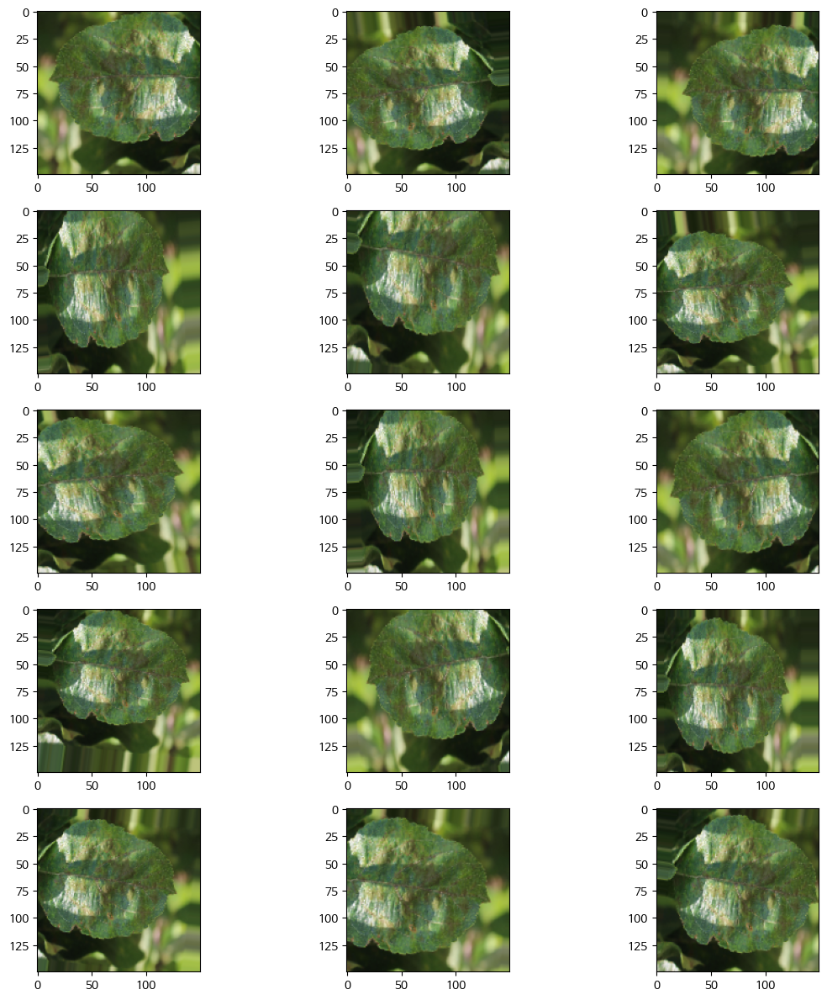

In [ ]:
# 위에서 만든 증식된이미지 확인하기
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in ex_result:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

### 모델 구축


---





In [ ]:
from keras.src.backend import dropout
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

In [ ]:
sq = Sequential()

sq.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_w, img_h, img_c) ))
sq.add(BatchNormalization())
sq.add(MaxPooling2D(pool_size=(2, 2)))
sq.add(Dropout(0.25))

sq.add(Conv2D(64, (3, 3), activation='relu' ))
sq.add(BatchNormalization())
sq.add(MaxPooling2D(pool_size=(2, 2)))
sq.add(Dropout(0.25))

sq.add(Conv2D(128, (3, 3), activation='relu' ))
sq.add(BatchNormalization())
sq.add(MaxPooling2D(pool_size=(2, 2)))
sq.add(Dropout(0.25))


sq.add(Flatten())
sq.add(Dense(512, activation='relu'))
sq.add(BatchNormalization())
sq.add(Dropout(0.5))
sq.add(Dense(4, activation='softmax'))


sq.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
sq.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 batch_normalization_12 (Ba  (None, 148, 148, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 74, 74, 32)        0         
                                                                 
 conv2d_10 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 batch_normalization_13 (Ba  (None, 72, 72, 64)       

In [ ]:
df = new_df[['img_file', 'label']]
df.head()

,img_file,label
0,Train_0.jpg,4
1,Train_1.jpg,2
2,Train_2.jpg,1
3,Train_3.jpg,3
4,Train_4.jpg,1


### 모델 학습

In [ ]:
train_total = train_img.shape[0]
valide_total = valide_img.shape[0]

In [ ]:
epochs=100
history = sq.fit_generator(
    train_result,
    epochs = epochs,
    validation_data=valide_result,
    validation_steps=int(train_total/batch_size),
    steps_per_epoch=int(valide_total/batch_size),
    callbacks=callbacks
)

# history = sq.fit(
#     train_img,
#     epochs = epochs,
#     validation_data=valide_img,
#     validation_steps=int(train_total/batch_size),
#     steps_per_epoch=int(valide_total/batch_size),
#     callbacks=callbacks
# )

<ipython-input-148-4e1ea262444e>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = sq.fit_generator(


Epoch 1/100
43/43 [==============================] - ETA: 0s - loss: 1.3628 - accuracy: 0.4558

43/43 [==============================] - 20s 461ms/step - loss: 1.3628 - accuracy: 0.4558 - val_loss: 2.7504 - val_accuracy: 0.2677 - lr: 5.0000e-04
Epoch 2/100
43/43 [==============================] - ETA: 0s - loss: 1.4113 - accuracy: 0.4163

43/43 [==============================] - 9s 214ms/step - loss: 1.4113 - accuracy: 0.4163 - lr: 5.0000e-04
Epoch 3/100
43/43 [==============================] - ETA: 0s - loss: 1.3333 - accuracy: 0.4743

43/43 [==============================] - 11s 260ms/step - loss: 1.3333 - accuracy: 0.4743 - lr: 5.0000e-04
Epoch 4/100
43/43 [==============================] - ETA: 0s - loss: 1.3731 - accuracy: 0.4486

43/43 [==============================] - 12s 271ms/step - loss: 1.3731 - accuracy: 0.4486 - lr: 5.0000e-04
Epoch 5/100
43/43 [==============================] - ETA: 0s - loss: 1.2518 - accuracy: 0.4884

43/43 [==============================] - 10s 229ms/step - loss: 1.2518 - accuracy: 0.4884 - lr: 5.0000e-04
Epoch 6/100
43/43 [==============================] - ETA: 0s - loss: 1.3695 - accuracy: 0.4395

43/43 [==============================] - 12s 287ms/step - loss: 1.3695 - accuracy: 0.4395 - lr: 5.0000e-04
Epoch 7/100
43/43 [==============================] - ETA: 0s - loss: 1.2884 - accuracy: 0.4860


Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
43/43 [==============================] - 10s 228ms/step - loss: 1.2884 - accuracy: 0.4860 - lr: 5.0000e-04
Epoch 8/100
43/43 [==============================] - ETA: 0s - loss: 1.2340 - accuracy: 0.4628

43/43 [==============================] - 9s 205ms/step - loss: 1.2340 - accuracy: 0.4628 - lr: 2.5000e-04
Epoch 9/100
43/43 [==============================] - ETA: 0s - loss: 1.2998 - accuracy: 0.4558

43/43 [==============================] - 11s 267ms/step - loss: 1.2998 - accuracy: 0.4558 - lr: 2.5000e-04
Epoch 10/100
43/43 [==============================] - ETA: 0s - loss: 1.1910 - accuracy: 0.5000

43/43 [==============================] - 9s 198ms/step - loss: 1.1910 - accuracy: 0.5000 - lr: 2.5000e-04
Epoch 11/100
43/43 [==============================] - ETA: 0s - loss: 1.2616 - accuracy: 0.4953

43/43 [==============================] - 11s 248ms/step - loss: 1.2616 - accuracy: 0.4953 - lr: 2.5000e-04
Epoch 12/100
43/43 [==============================] - ETA: 0s - loss: 1.2950 - accuracy: 0.4439


Epoch 12: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
43/43 [==============================] - 9s 215ms/step - loss: 1.2950 - accuracy: 0.4439 - lr: 2.5000e-04
Epoch 13/100
43/43 [==============================] - ETA: 0s - loss: 1.2293 - accuracy: 0.4930

43/43 [==============================] - 11s 248ms/step - loss: 1.2293 - accuracy: 0.4930 - lr: 1.2500e-04
Epoch 14/100
43/43 [==============================] - ETA: 0s - loss: 1.2366 - accuracy: 0.4977


Epoch 14: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
43/43 [==============================] - 11s 250ms/step - loss: 1.2366 - accuracy: 0.4977 - lr: 1.2500e-04
Epoch 15/100
43/43 [==============================] - ETA: 0s - loss: 1.2359 - accuracy: 0.4814

43/43 [==============================] - 8s 196ms/step - loss: 1.2359 - accuracy: 0.4814 - lr: 6.2500e-05
Epoch 16/100
43/43 [==============================] - ETA: 0s - loss: 1.2271 - accuracy: 0.5000


Epoch 16: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
43/43 [==============================] - 12s 277ms/step - loss: 1.2271 - accuracy: 0.5000 - lr: 6.2500e-05
Epoch 17/100
43/43 [==============================] - ETA: 0s - loss: 1.1293 - accuracy: 0.5116

43/43 [==============================] - 8s 195ms/step - loss: 1.1293 - accuracy: 0.5116 - lr: 3.1250e-05
Epoch 18/100
43/43 [==============================] - ETA: 0s - loss: 1.1686 - accuracy: 0.4953

43/43 [==============================] - 11s 256ms/step - loss: 1.1686 - accuracy: 0.4953 - lr: 3.1250e-05
Epoch 19/100
43/43 [==============================] - ETA: 0s - loss: 1.1843 - accuracy: 0.5000


Epoch 19: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.
43/43 [==============================] - 10s 221ms/step - loss: 1.1843 - accuracy: 0.5000 - lr: 3.1250e-05
Epoch 20/100
43/43 [==============================] - ETA: 0s - loss: 1.1351 - accuracy: 0.5140

43/43 [==============================] - 10s 234ms/step - loss: 1.1351 - accuracy: 0.5140 - lr: 1.5625e-05
Epoch 21/100
43/43 [==============================] - ETA: 0s - loss: 1.2146 - accuracy: 0.5186


Epoch 21: ReduceLROnPlateau reducing learning rate to 1e-05.
43/43 [==============================] - 9s 209ms/step - loss: 1.2146 - accuracy: 0.5186 - lr: 1.5625e-05
Epoch 22/100
43/43 [==============================] - ETA: 0s - loss: 1.1634 - accuracy: 0.5234

43/43 [==============================] - 11s 255ms/step - loss: 1.1634 - accuracy: 0.5234 - lr: 1.0000e-05
Epoch 23/100
43/43 [==============================] - ETA: 0s - loss: 1.1373 - accuracy: 0.5442

43/43 [==============================] - 8s 196ms/step - loss: 1.1373 - accuracy: 0.5442 - lr: 1.0000e-05
Epoch 24/100
43/43 [==============================] - ETA: 0s - loss: 1.1627 - accuracy: 0.5279

43/43 [==============================] - 11s 255ms/step - loss: 1.1627 - accuracy: 0.5279 - lr: 1.0000e-05
Epoch 25/100
43/43 [==============================] - ETA: 0s - loss: 1.0979 - accuracy: 0.5186

43/43 [==============================] - 9s 200ms/step - loss: 1.0979 - accuracy: 0.5186 - lr: 1.0000e-05
Epoch 26/100
43/43 [==============================] - ETA: 0s - loss: 1.1619 - accuracy: 0.4953

43/43 [==============================] - 10s 231ms/step - loss: 1.1619 - accuracy: 0.4953 - lr: 1.0000e-05
Epoch 27/100
43/43 [==============================] - ETA: 0s - loss: 1.1181 - accuracy: 0.5070

43/43 [==============================] - 10s 241ms/step - loss: 1.1181 - accuracy: 0.5070 - lr: 1.0000e-05
Epoch 28/100
43/43 [==============================] - ETA: 0s - loss: 1.1417 - accuracy: 0.5304

43/43 [==============================] - 9s 204ms/step - loss: 1.1417 - accuracy: 0.5304 - lr: 1.0000e-05
Epoch 29/100
43/43 [==============================] - ETA: 0s - loss: 1.2164 - accuracy: 0.4790

43/43 [==============================] - 11s 257ms/step - loss: 1.2164 - accuracy: 0.4790 - lr: 1.0000e-05
Epoch 30/100
43/43 [==============================] - ETA: 0s - loss: 1.1837 - accuracy: 0.4791

43/43 [==============================] - 9s 201ms/step - loss: 1.1837 - accuracy: 0.4791 - lr: 1.0000e-05
Epoch 31/100
43/43 [==============================] - ETA: 0s - loss: 1.1713 - accuracy: 0.5164

43/43 [==============================] - 10s 242ms/step - loss: 1.1713 - accuracy: 0.5164 - lr: 1.0000e-05
Epoch 32/100
43/43 [==============================] - ETA: 0s - loss: 1.0951 - accuracy: 0.5209

43/43 [==============================] - 8s 195ms/step - loss: 1.0951 - accuracy: 0.5209 - lr: 1.0000e-05
Epoch 33/100
43/43 [==============================] - ETA: 0s - loss: 1.2045 - accuracy: 0.4883

43/43 [==============================] - 11s 250ms/step - loss: 1.2045 - accuracy: 0.4883 - lr: 1.0000e-05
Epoch 34/100
43/43 [==============================] - ETA: 0s - loss: 1.1218 - accuracy: 0.5349

43/43 [==============================] - 10s 236ms/step - loss: 1.1218 - accuracy: 0.5349 - lr: 1.0000e-05
Epoch 35/100
43/43 [==============================] - ETA: 0s - loss: 1.1748 - accuracy: 0.5116

43/43 [==============================] - 8s 187ms/step - loss: 1.1748 - accuracy: 0.5116 - lr: 1.0000e-05
Epoch 36/100
43/43 [==============================] - ETA: 0s - loss: 1.1498 - accuracy: 0.5256

43/43 [==============================] - 14s 323ms/step - loss: 1.1498 - accuracy: 0.5256 - lr: 1.0000e-05
Epoch 37/100
43/43 [==============================] - ETA: 0s - loss: 1.2079 - accuracy: 0.4977

43/43 [==============================] - 9s 198ms/step - loss: 1.2079 - accuracy: 0.4977 - lr: 1.0000e-05
Epoch 38/100
43/43 [==============================] - ETA: 0s - loss: 1.1657 - accuracy: 0.5070

43/43 [==============================] - 11s 245ms/step - loss: 1.1657 - accuracy: 0.5070 - lr: 1.0000e-05
Epoch 39/100
43/43 [==============================] - ETA: 0s - loss: 1.1655 - accuracy: 0.5163

43/43 [==============================] - 9s 209ms/step - loss: 1.1655 - accuracy: 0.5163 - lr: 1.0000e-05
Epoch 40/100
43/43 [==============================] - ETA: 0s - loss: 1.1337 - accuracy: 0.5163

43/43 [==============================] - 11s 252ms/step - loss: 1.1337 - accuracy: 0.5163 - lr: 1.0000e-05
Epoch 41/100
43/43 [==============================] - ETA: 0s - loss: 1.1583 - accuracy: 0.5163

43/43 [==============================] - 8s 188ms/step - loss: 1.1583 - accuracy: 0.5163 - lr: 1.0000e-05
Epoch 42/100
43/43 [==============================] - ETA: 0s - loss: 1.1524 - accuracy: 0.5140

43/43 [==============================] - 11s 244ms/step - loss: 1.1524 - accuracy: 0.5140 - lr: 1.0000e-05
Epoch 43/100
43/43 [==============================] - ETA: 0s - loss: 1.1482 - accuracy: 0.5163

43/43 [==============================] - 9s 211ms/step - loss: 1.1482 - accuracy: 0.5163 - lr: 1.0000e-05
Epoch 44/100
43/43 [==============================] - ETA: 0s - loss: 1.1419 - accuracy: 0.5302

43/43 [==============================] - 10s 223ms/step - loss: 1.1419 - accuracy: 0.5302 - lr: 1.0000e-05
Epoch 45/100
43/43 [==============================] - ETA: 0s - loss: 1.1418 - accuracy: 0.5023

43/43 [==============================] - 10s 242ms/step - loss: 1.1418 - accuracy: 0.5023 - lr: 1.0000e-05
Epoch 46/100
43/43 [==============================] - ETA: 0s - loss: 1.1106 - accuracy: 0.5233

43/43 [==============================] - 11s 253ms/step - loss: 1.1106 - accuracy: 0.5233 - lr: 1.0000e-05
Epoch 47/100
43/43 [==============================] - ETA: 0s - loss: 1.1527 - accuracy: 0.5116

43/43 [==============================] - 8s 194ms/step - loss: 1.1527 - accuracy: 0.5116 - lr: 1.0000e-05
Epoch 48/100
43/43 [==============================] - ETA: 0s - loss: 1.0875 - accuracy: 0.5374

43/43 [==============================] - 10s 221ms/step - loss: 1.0875 - accuracy: 0.5374 - lr: 1.0000e-05
Epoch 49/100
43/43 [==============================] - ETA: 0s - loss: 1.0893 - accuracy: 0.5605

43/43 [==============================] - 12s 278ms/step - loss: 1.0893 - accuracy: 0.5605 - lr: 1.0000e-05
Epoch 50/100
43/43 [==============================] - ETA: 0s - loss: 1.0917 - accuracy: 0.5674

43/43 [==============================] - 10s 237ms/step - loss: 1.0917 - accuracy: 0.5674 - lr: 1.0000e-05
Epoch 51/100
43/43 [==============================] - ETA: 0s - loss: 1.1211 - accuracy: 0.5140

43/43 [==============================] - 9s 221ms/step - loss: 1.1211 - accuracy: 0.5140 - lr: 1.0000e-05
Epoch 52/100
43/43 [==============================] - ETA: 0s - loss: 1.1625 - accuracy: 0.5070

43/43 [==============================] - 9s 203ms/step - loss: 1.1625 - accuracy: 0.5070 - lr: 1.0000e-05
Epoch 53/100
43/43 [==============================] - ETA: 0s - loss: 1.1105 - accuracy: 0.5187

43/43 [==============================] - 11s 257ms/step - loss: 1.1105 - accuracy: 0.5187 - lr: 1.0000e-05
Epoch 54/100
43/43 [==============================] - ETA: 0s - loss: 1.1597 - accuracy: 0.4953

43/43 [==============================] - 8s 188ms/step - loss: 1.1597 - accuracy: 0.4953 - lr: 1.0000e-05
Epoch 55/100
43/43 [==============================] - ETA: 0s - loss: 1.1591 - accuracy: 0.5163

43/43 [==============================] - 10s 240ms/step - loss: 1.1591 - accuracy: 0.5163 - lr: 1.0000e-05
Epoch 56/100
43/43 [==============================] - ETA: 0s - loss: 1.1626 - accuracy: 0.4791

43/43 [==============================] - 9s 199ms/step - loss: 1.1626 - accuracy: 0.4791 - lr: 1.0000e-05
Epoch 57/100
43/43 [==============================] - ETA: 0s - loss: 1.0851 - accuracy: 0.5535

43/43 [==============================] - 11s 246ms/step - loss: 1.0851 - accuracy: 0.5535 - lr: 1.0000e-05
Epoch 58/100
43/43 [==============================] - ETA: 0s - loss: 1.1117 - accuracy: 0.5488

43/43 [==============================] - 11s 250ms/step - loss: 1.1117 - accuracy: 0.5488 - lr: 1.0000e-05
Epoch 59/100
43/43 [==============================] - ETA: 0s - loss: 1.2113 - accuracy: 0.4860

43/43 [==============================] - 8s 186ms/step - loss: 1.2113 - accuracy: 0.4860 - lr: 1.0000e-05
Epoch 60/100
43/43 [==============================] - ETA: 0s - loss: 1.0951 - accuracy: 0.5374

43/43 [==============================] - 9s 214ms/step - loss: 1.0951 - accuracy: 0.5374 - lr: 1.0000e-05
Epoch 61/100
43/43 [==============================] - ETA: 0s - loss: 1.1673 - accuracy: 0.5047

43/43 [==============================] - 10s 245ms/step - loss: 1.1673 - accuracy: 0.5047 - lr: 1.0000e-05
Epoch 62/100
43/43 [==============================] - ETA: 0s - loss: 1.0932 - accuracy: 0.5467

43/43 [==============================] - 8s 194ms/step - loss: 1.0932 - accuracy: 0.5467 - lr: 1.0000e-05
Epoch 63/100
43/43 [==============================] - ETA: 0s - loss: 1.1141 - accuracy: 0.5442

43/43 [==============================] - 11s 249ms/step - loss: 1.1141 - accuracy: 0.5442 - lr: 1.0000e-05
Epoch 64/100
43/43 [==============================] - ETA: 0s - loss: 1.1426 - accuracy: 0.5163

43/43 [==============================] - 10s 222ms/step - loss: 1.1426 - accuracy: 0.5163 - lr: 1.0000e-05
Epoch 65/100
43/43 [==============================] - ETA: 0s - loss: 1.1111 - accuracy: 0.5491

43/43 [==============================] - 9s 217ms/step - loss: 1.1111 - accuracy: 0.5491 - lr: 1.0000e-05
Epoch 66/100
43/43 [==============================] - ETA: 0s - loss: 1.1974 - accuracy: 0.4930

43/43 [==============================] - 9s 203ms/step - loss: 1.1974 - accuracy: 0.4930 - lr: 1.0000e-05
Epoch 67/100
43/43 [==============================] - ETA: 0s - loss: 1.1413 - accuracy: 0.5140

43/43 [==============================] - 10s 244ms/step - loss: 1.1413 - accuracy: 0.5140 - lr: 1.0000e-05
Epoch 68/100
43/43 [==============================] - ETA: 0s - loss: 1.1341 - accuracy: 0.5349

43/43 [==============================] - 11s 254ms/step - loss: 1.1341 - accuracy: 0.5349 - lr: 1.0000e-05
Epoch 69/100
43/43 [==============================] - ETA: 0s - loss: 1.0531 - accuracy: 0.5421

43/43 [==============================] - 10s 231ms/step - loss: 1.0531 - accuracy: 0.5421 - lr: 1.0000e-05
Epoch 70/100
43/43 [==============================] - ETA: 0s - loss: 1.0783 - accuracy: 0.5256

43/43 [==============================] - 9s 201ms/step - loss: 1.0783 - accuracy: 0.5256 - lr: 1.0000e-05
Epoch 71/100
43/43 [==============================] - ETA: 0s - loss: 1.0424 - accuracy: 0.5607

43/43 [==============================] - 11s 253ms/step - loss: 1.0424 - accuracy: 0.5607 - lr: 1.0000e-05
Epoch 72/100
43/43 [==============================] - ETA: 0s - loss: 1.0371 - accuracy: 0.5698

43/43 [==============================] - 8s 191ms/step - loss: 1.0371 - accuracy: 0.5698 - lr: 1.0000e-05
Epoch 73/100
43/43 [==============================] - ETA: 0s - loss: 1.1202 - accuracy: 0.5395

43/43 [==============================] - 11s 252ms/step - loss: 1.1202 - accuracy: 0.5395 - lr: 1.0000e-05
Epoch 74/100
43/43 [==============================] - ETA: 0s - loss: 1.0859 - accuracy: 0.5140

43/43 [==============================] - 9s 199ms/step - loss: 1.0859 - accuracy: 0.5140 - lr: 1.0000e-05
Epoch 75/100
43/43 [==============================] - ETA: 0s - loss: 1.2211 - accuracy: 0.5116

43/43 [==============================] - 10s 237ms/step - loss: 1.2211 - accuracy: 0.5116 - lr: 1.0000e-05
Epoch 76/100
43/43 [==============================] - ETA: 0s - loss: 1.1115 - accuracy: 0.5395

43/43 [==============================] - 9s 202ms/step - loss: 1.1115 - accuracy: 0.5395 - lr: 1.0000e-05
Epoch 77/100
43/43 [==============================] - ETA: 0s - loss: 1.1115 - accuracy: 0.5605

43/43 [==============================] - 11s 252ms/step - loss: 1.1115 - accuracy: 0.5605 - lr: 1.0000e-05
Epoch 78/100
43/43 [==============================] - ETA: 0s - loss: 1.1268 - accuracy: 0.5442

43/43 [==============================] - 8s 195ms/step - loss: 1.1268 - accuracy: 0.5442 - lr: 1.0000e-05
Epoch 79/100
43/43 [==============================] - ETA: 0s - loss: 1.0862 - accuracy: 0.5419

43/43 [==============================] - 11s 254ms/step - loss: 1.0862 - accuracy: 0.5419 - lr: 1.0000e-05
Epoch 80/100
43/43 [==============================] - ETA: 0s - loss: 1.1186 - accuracy: 0.5302

43/43 [==============================] - 8s 194ms/step - loss: 1.1186 - accuracy: 0.5302 - lr: 1.0000e-05
Epoch 81/100
43/43 [==============================] - ETA: 0s - loss: 1.1445 - accuracy: 0.5302

43/43 [==============================] - 11s 249ms/step - loss: 1.1445 - accuracy: 0.5302 - lr: 1.0000e-05
Epoch 82/100
43/43 [==============================] - ETA: 0s - loss: 1.1069 - accuracy: 0.5374

43/43 [==============================] - 10s 222ms/step - loss: 1.1069 - accuracy: 0.5374 - lr: 1.0000e-05
Epoch 83/100
43/43 [==============================] - ETA: 0s - loss: 1.1399 - accuracy: 0.4953

43/43 [==============================] - 11s 251ms/step - loss: 1.1399 - accuracy: 0.4953 - lr: 1.0000e-05
Epoch 84/100
43/43 [==============================] - ETA: 0s - loss: 1.1327 - accuracy: 0.5209

43/43 [==============================] - 11s 262ms/step - loss: 1.1327 - accuracy: 0.5209 - lr: 1.0000e-05
Epoch 85/100
43/43 [==============================] - ETA: 0s - loss: 1.1364 - accuracy: 0.4953

43/43 [==============================] - 11s 247ms/step - loss: 1.1364 - accuracy: 0.4953 - lr: 1.0000e-05
Epoch 86/100
43/43 [==============================] - ETA: 0s - loss: 1.1452 - accuracy: 0.5070

43/43 [==============================] - 9s 213ms/step - loss: 1.1452 - accuracy: 0.5070 - lr: 1.0000e-05
Epoch 87/100
43/43 [==============================] - ETA: 0s - loss: 1.1637 - accuracy: 0.5234

43/43 [==============================] - 10s 229ms/step - loss: 1.1637 - accuracy: 0.5234 - lr: 1.0000e-05
Epoch 88/100
43/43 [==============================] - ETA: 0s - loss: 1.0536 - accuracy: 0.5537

43/43 [==============================] - 10s 227ms/step - loss: 1.0536 - accuracy: 0.5537 - lr: 1.0000e-05
Epoch 89/100
43/43 [==============================] - ETA: 0s - loss: 1.1727 - accuracy: 0.4953

43/43 [==============================] - 9s 208ms/step - loss: 1.1727 - accuracy: 0.4953 - lr: 1.0000e-05
Epoch 90/100
43/43 [==============================] - ETA: 0s - loss: 1.1173 - accuracy: 0.5256

43/43 [==============================] - 11s 255ms/step - loss: 1.1173 - accuracy: 0.5256 - lr: 1.0000e-05
Epoch 91/100
43/43 [==============================] - ETA: 0s - loss: 1.1877 - accuracy: 0.4698

43/43 [==============================] - 8s 184ms/step - loss: 1.1877 - accuracy: 0.4698 - lr: 1.0000e-05
Epoch 92/100
43/43 [==============================] - ETA: 0s - loss: 1.0441 - accuracy: 0.5581

43/43 [==============================] - 11s 247ms/step - loss: 1.0441 - accuracy: 0.5581 - lr: 1.0000e-05
Epoch 93/100
43/43 [==============================] - ETA: 0s - loss: 1.1238 - accuracy: 0.5326

43/43 [==============================] - 9s 204ms/step - loss: 1.1238 - accuracy: 0.5326 - lr: 1.0000e-05
Epoch 94/100
43/43 [==============================] - ETA: 0s - loss: 1.1178 - accuracy: 0.5395

43/43 [==============================] - 11s 246ms/step - loss: 1.1178 - accuracy: 0.5395 - lr: 1.0000e-05
Epoch 95/100
43/43 [==============================] - ETA: 0s - loss: 1.1353 - accuracy: 0.5070

43/43 [==============================] - 11s 251ms/step - loss: 1.1353 - accuracy: 0.5070 - lr: 1.0000e-05
Epoch 96/100
43/43 [==============================] - ETA: 0s - loss: 1.0746 - accuracy: 0.5421

43/43 [==============================] - 10s 227ms/step - loss: 1.0746 - accuracy: 0.5421 - lr: 1.0000e-05
Epoch 97/100
43/43 [==============================] - ETA: 0s - loss: 1.1271 - accuracy: 0.5209

43/43 [==============================] - 9s 211ms/step - loss: 1.1271 - accuracy: 0.5209 - lr: 1.0000e-05
Epoch 98/100
43/43 [==============================] - ETA: 0s - loss: 1.1823 - accuracy: 0.4814

43/43 [==============================] - 9s 218ms/step - loss: 1.1823 - accuracy: 0.4814 - lr: 1.0000e-05
Epoch 99/100
43/43 [==============================] - ETA: 0s - loss: 1.1110 - accuracy: 0.5465

43/43 [==============================] - 10s 226ms/step - loss: 1.1110 - accuracy: 0.5465 - lr: 1.0000e-05
Epoch 100/100
43/43 [==============================] - ETA: 0s - loss: 1.1051 - accuracy: 0.5467

43/43 [==============================] - 12s 272ms/step - loss: 1.1051 - accuracy: 0.5467 - lr: 1.0000e-05


In [ ]:
history.history

{'loss': [1.3627848625183105,
  1.4113386869430542,
  1.3333263397216797,
  1.3731340169906616,
  1.2517715692520142,
  1.369523048400879,
  1.2884312868118286,
  1.2340236902236938,
  1.2998219728469849,
  1.1910357475280762,
  1.2615550756454468,
  1.2950077056884766,
  1.229328989982605,
  1.236599326133728,
  1.2359002828598022,
  1.2270547151565552,
  1.1293044090270996,
  1.168563961982727,
  1.1843452453613281,
  1.135114073753357,
  1.2146223783493042,
  1.163434624671936,
  1.1373180150985718,
  1.1626871824264526,
  1.0978811979293823,
  1.1618729829788208,
  1.1180739402770996,
  1.141700029373169,
  1.216378092765808,
  1.1837142705917358,
  1.1713136434555054,
  1.0950963497161865,
  1.2044960260391235,
  1.1217542886734009,
  1.174824833869934,
  1.149793267250061,
  1.2078529596328735,
  1.1657326221466064,
  1.1654603481292725,
  1.1337437629699707,
  1.1583420038223267,
  1.152382254600525,
  1.1481893062591553,
  1.1418923139572144,
  1.1417711973190308,
  1.110562443

In [ ]:
history.history['loss']

In [ ]:
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
# ax1.plot(history.history['loss'], color='b', label="Training loss")
# ax1.plot(history.history['val_loss'], color='r', label="validation loss")
# ax1.set_xticks(np.arange(1, epochs, 1))
# ax1.set_yticks(np.arange(0, 1, 0.1))

# ax2.plot(history.history['accuracy'], color='b', label="Training accuracy")
# ax2.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
# ax2.set_xticks(np.arange(1, epochs, 1))

# legend = plt.legend(loc='best', shadow=True)
# plt.tight_layout()
# plt.show()

### test 데이터 가져오기

In [ ]:
import os
testimg_path = '/content/gdrive/MyDrive/응용/kaggle/plant/data/test/'
test_filenames = os.listdir(testimg_path)
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]

In [ ]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    dataframe=test_df,
    directory=testimg_path,
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=(img_w, img_h),
    batch_size=batch_size,
    shuffle=False
)

Found 1821 validated image filenames.


### 예측

In [ ]:
predict = sq.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))

<ipython-input-153-bc98740d40ca>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predict = sq.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))


In [ ]:
test_df['label'] = np.argmax(predict, axis=-1)

In [ ]:
test_df['label'].unique()

array([3, 0, 2, 1])

In [ ]:
test_df['label'] = test_df['label'].replace({
    'healthy': 0,
    'multiple_diseases': 1,
    'rust' : 2,
    'scab' : 3
})

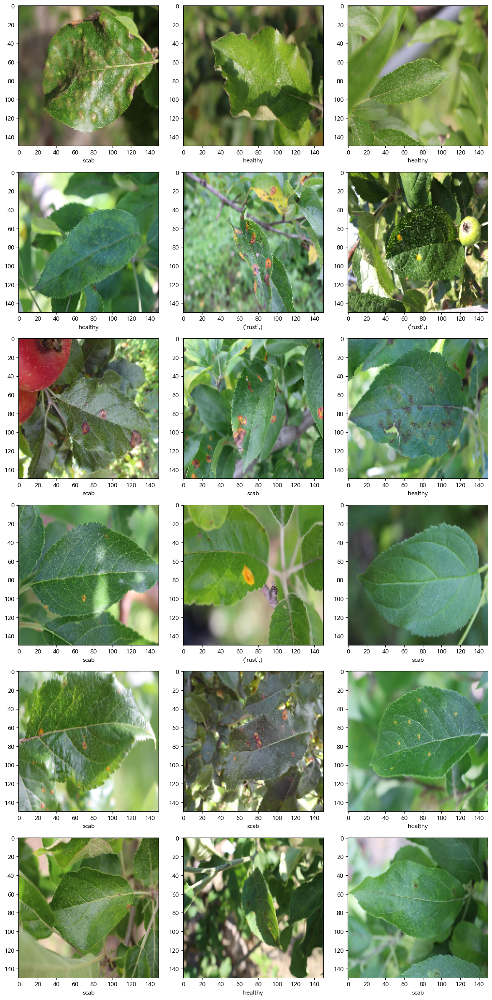

In [ ]:
from keras.preprocessing.image import load_img
sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test.iterrows():
    filename = row['filename']
    label = row['label']
    img = load_img(testimg_path+filename, target_size=(img_w, img_h))
    if label == 0:
      label='healthy'
    elif label == 1:
      label = 'multiple_diseases',
    elif label == 2:
      label = 'rust',
    elif label == 3:
      label = 'scab'
    else :
      label = '인식실패'

    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    # plt.xlabel(filename + '(' + "{}".format(label) + ')' )
    plt.xlabel(label)
plt.tight_layout()
plt.show()